# Setup

In [1]:
!pwd

/home/umni2/a/umnilab/users/verma99/mk/home_detection/code


In [2]:
from setup import *

## City/region

In [3]:
indy = Region('Indianapolis', 'Indiana', [
    'Boone','Hamilton','Hancock','Hendricks','Johnson','Madison','Marion','Morgan','Shelby'])

In [4]:
aus = Region('Austin', 'Texas', ['Bastrop','Caldwell','Hays','Travis','Williamson'])

In [5]:
hous = Region('Houston', 'Texas', [
    'Austin','Brazoria','Chambers','Fort Bend','Galveston','Harris','Liberty','Montgomery','Waller'])

In [6]:
rgns = [indy, aus, hous]

# Boundaries

## City limit

In [7]:
def get_city_limit(rgn, save=True):
    df = gpd.read_file(MK / f'general/data/cities/{rgn}/boundary.gpkg')
    if save:
        df.to_crs(CRS_DEG).to_file(rgn.geom / 'boundary.gpkg')
    return df

In [8]:
indy.city_lim = get_city_limit(indy)
aus.city_lim = get_city_limit(aus)
hous.city_lim = get_city_limit(hous)

## Counties layer

### US counties

In [9]:
# us_counties = mk.geo.get_tiger_shp('county', MK / 'General/data/usa/counties.shp.zip').disp() # t=5s

In [10]:
us_counties = gpd.read_file(MK / 'general/data/usa/counties.shp.zip').disp()

3,234 rows x 18 cols; Memory: 2.7 MiB; CRS: epsg:4269


,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
,<object>,<object>,<object>,<object>,<object>,<object>,<object>,<object>,<object>,<object>,<object>,<object>,<object>,<int64>,<int64>,<object>,<object>,<geometry>
0,31,039,00835841,31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477645345,10690204,+41.9158651,-096.7885168,"POLYGON ((-96.555155 41.915868, -96.555153 41...."


### State FIPS codes
Obtained from https://transition.fcc.gov/oet/info/maps/census/fips/fips.txt

In [11]:
state_fips = pd.read_csv(MK / 'general/data/usa/state_fips.csv').set_index('state')['fips'].disp(3)

51 rows; Memory: 0.0 MiB
state
ALABAMA    1
ALASKA     2
ARIZONA    4
Name: fips, dtype: int64


### Get data

In [12]:
def get_counties_shp(rgn, us_counties=us_counties, state_fips=state_fips, save=True):
    outfile = U.mkdir(rgn.geom) / 'counties.gpkg'
    if os.path.exists(outfile):
        return gpd.read_file(outfile)
    df = (us_counties.rename(columns=str.lower)
          ['statefp geoid name aland awater geometry'.split()])
    df = (df[(df['statefp'] == f'{state_fips.loc[rgn.state.upper()]:02}') &
             (df['name'].isin(rgn.counties))]
          .to_crs(CRS_DEG).set_index('geoid').sort_index())
    if save:
        df.to_file(outfile)
    return df

In [13]:
indy.cnty = get_counties_shp(indy).disp()

9 rows x 6 cols; Memory: 0.0 MiB; CRS: epsg:4326


,geoid,statefp,name,aland,awater,geometry
,<object>,<object>,<object>,<int64>,<int64>,<geometry>
0,18011,18,Boone,1095260003,876741,"POLYGON ((-86.359962 39.923999, -86.362216 39...."


In [14]:
aus.cnty = get_counties_shp(aus).disp(0)

5 rows x 6 cols; Memory: 0.0 MiB; CRS: epsg:4326


,geoid,statefp,name,aland,awater,geometry
,<object>,<object>,<object>,<int64>,<int64>,<geometry>


In [15]:
hous.cnty = get_counties_shp(hous).disp(0)

9 rows x 6 cols; Memory: 0.0 MiB; CRS: epsg:4326


,geoid,statefp,name,aland,awater,geometry
,<object>,<object>,<object>,<int64>,<int64>,<geometry>


### Bounding boxes

In [16]:
indy.bbox = indy.cnty.geometry.unary_union.bounds; indy.bbox

(-86.69586, 39.338291, -85.575541, 40.379799)

In [17]:
hous.bbox = hous.cnty.geometry.unary_union.bounds; hous.bbox

(-96.62198, 28.764837, -94.353383, 30.630284)

In [18]:
aus.bbox = aus.cnty.geometry.unary_union.bounds; aus.bbox

(-98.2976, 29.630718, -97.024461, 30.904414)

### Visualize

In [19]:
from matplotlib_scalebar.scalebar import ScaleBar

In [20]:
def plot_counties(rgn, size=(4, 4), dpi=150, color='cyan', alpha=0.4, save=True):
    cnty = rgn.cnty.to_crs(CRS_M)
    area = cnty.area.sum() * U.SQM2SQMI
    title = f'{rgn.name} MSA\n ({int(area):,} sq.mi.)'
    ax = U.plot(size=size, dpi=dpi, axoff=1, title=title)
    cnty.plot(ax=ax, facecolor=color, alpha=alpha, edgecolor='k')
    rgn.city_lim.to_crs(CRS_M).plot(ax=ax, facecolor='r', edgecolor='none', alpha=0.5)
    x = (cnty.assign(geometry = lambda df: df.geometry.centroid)
         .set_index('name').geometry.apply(lambda x: x.coords[0]))
    for name, xy in x.to_dict().items():
        ax.text(*xy, name, ha='center')
    ax.add_artist(ScaleBar(1))
    area = rgn.city_lim.to_crs(CRS_M).area.iloc[0] * U.SQM2SQMI
    patch = mpl.patches.Patch(facecolor='r', alpha=0.5,
                              label=f'City limit ({area:.0f} sq.mi.)')
    ax.legend(handles=[patch], loc='lower right')
    if save: P.imsave(f'Region outline - {rgn}')

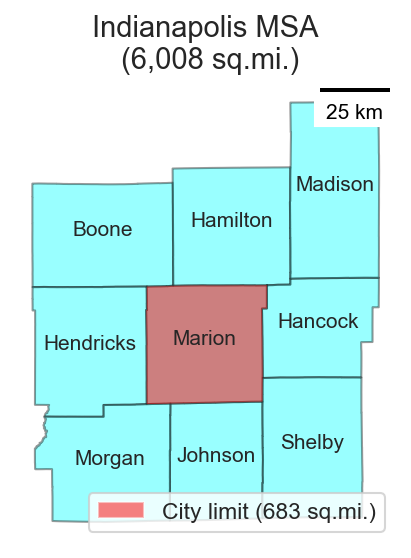

In [21]:
plot_counties(indy)

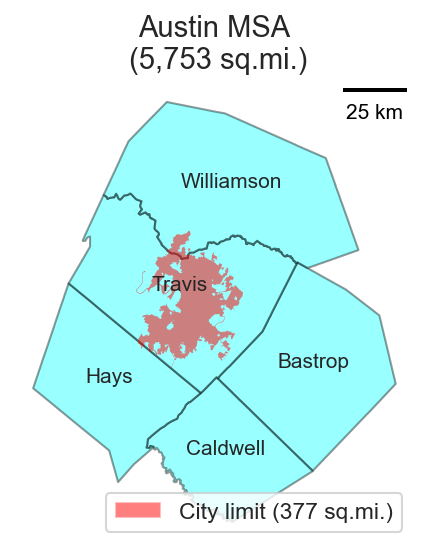

In [22]:
plot_counties(aus)

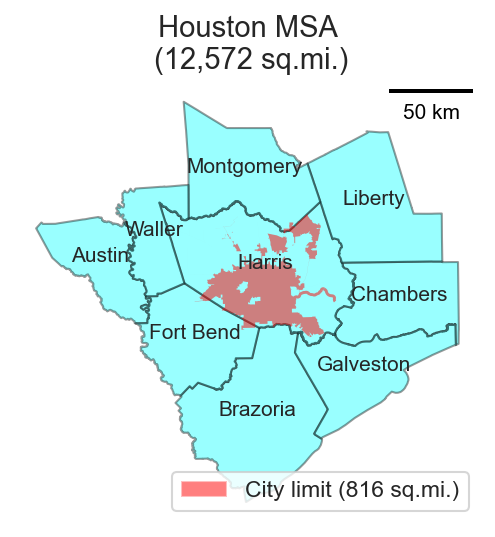

In [23]:
plot_counties(hous)

## CBGs layer

### Regional CBGs

In [24]:
def get_cbg_shp(rgn, state_root=MK / 'general/data/states', save=True):
    outfile = rgn.geom / 'cbgs.gpkg'
    if os.path.exists(outfile):
        return gpd.read_file(outfile)
    fips = int(state_fips.loc[rgn.state.upper()])
    path = U.mkdir(f'{state_root}/{rgn.state.lower()}/') + 'cbgs.zip'
    df = mk.geo.get_tiger_shp('bg', path, fips=fips).rename(columns=str.lower)
    df['county_id'] = df['statefp'] + df['countyfp']
    df = (df.merge(rgn.cnty['name'].rename('county'),
                   left_on='county_id', right_index=True)
          .to_crs(CRS_DEG).set_index('geoid')
          [['county','aland','awater','geometry']])
    if save:
        df.to_file(outfile)
    return df

In [25]:
indy.cbgs = get_cbg_shp(indy).disp()

1,400 rows x 5 cols; Memory: 0.2 MiB; CRS: epsg:4326


,geoid,county,aland,awater,geometry
,<object>,<object>,<int64>,<int64>,<geometry>
0,180973102032,Marion,1274433,0,"POLYGON ((-86.270667 39.867142, -86.270596 39...."


In [26]:
aus.cbgs = get_cbg_shp(aus).disp(0)

1,297 rows x 5 cols; Memory: 0.2 MiB; CRS: epsg:4326


,geoid,county,aland,awater,geometry
,<object>,<object>,<int64>,<int64>,<geometry>


In [27]:
hous.cbgs = get_cbg_shp(hous).disp(0)

4,154 rows x 5 cols; Memory: 0.6 MiB; CRS: epsg:4326


,geoid,county,aland,awater,geometry
,<object>,<object>,<int64>,<int64>,<geometry>


# Census data

## Download data

In [28]:
def get_acs_data(rgn, state_fips=state_fips, cols=mk.acs.IMP_FIELDS, save=True):
    outfile = rgn.geom / 'acs.gpkg'
    if os.path.exists(outfile):
        return gpd.read_file(outfile)
    df = mk.acs.download([
        ('state', f'{state_fips.loc[rgn.state.upper()]:02}'),
        ('county', ','.join(rgn.cnty.index.str.slice(2, 5))),
        ('tract', '*'), ('block group', '*')
    ], list(cols.keys()))
    x = Pdf([dict(zip(df.index.names, x)) for x in df.index])
    df.index = x['state'] + x['county'] + x['tract'] + x['block group']
    df = df.rename_axis('geoid').rename(columns=cols)
    df = rgn.cbgs.reset_index().merge(df.reset_index(), on='geoid')
    df = df.drop(columns='index', errors='ignore')
    df['pop_density'] = df['popu'] / (df['aland'] * U.SQM2SQMI)
    if save:
        df.to_file(outfile)
    return df

In [29]:
%time indy.acs = get_acs_data(indy).disp(0) # t=4s

1,400 rows x 38 cols; Memory: 0.6 MiB; CRS: epsg:4326


,geoid,county,aland,awater,popu,hh,age_minor,age_adult,age_senior,age_median,sex_female,sex_male,race_white,race_black,edu_eligible,edu_bachelors,employ_total,employ_in_LF,employ_not_in_LF,inc_total,inc_avg,inc_total_hh,inc_median,pop_poor,pop_nonpoor,hh_poor,hh_nonpoor,cm_car,cm_pool,cm_pt,cm_bus,cm_subway,cm_taxi,cm_bike,cm_walk,cm_wfm,pop_density,geometry
,<object>,<object>,<int64>,<int64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<object>,<object>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<geometry>


CPU times: user 193 ms, sys: 13.2 ms, total: 206 ms
Wall time: 228 ms


In [30]:
%time aus.acs = get_acs_data(aus).disp(0) # t=4s

1,297 rows x 38 cols; Memory: 0.6 MiB; CRS: epsg:4326


,geoid,county,aland,awater,popu,hh,age_minor,age_adult,age_senior,age_median,sex_female,sex_male,race_white,race_black,edu_eligible,edu_bachelors,employ_total,employ_in_LF,employ_not_in_LF,inc_total,inc_avg,inc_total_hh,inc_median,pop_poor,pop_nonpoor,hh_poor,hh_nonpoor,cm_car,cm_pool,cm_pt,cm_bus,cm_subway,cm_taxi,cm_bike,cm_walk,cm_wfm,pop_density,geometry
,<object>,<object>,<int64>,<int64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<object>,<object>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<geometry>


CPU times: user 224 ms, sys: 18.3 ms, total: 242 ms
Wall time: 256 ms


In [31]:
%time hous.acs = get_acs_data(hous).disp(0) # t=8s

4,154 rows x 38 cols; Memory: 1.8 MiB; CRS: epsg:4326


,geoid,county,aland,awater,popu,hh,age_minor,age_adult,age_senior,age_median,sex_female,sex_male,race_white,race_black,edu_eligible,edu_bachelors,employ_total,employ_in_LF,employ_not_in_LF,inc_total,inc_avg,inc_total_hh,inc_median,pop_poor,pop_nonpoor,hh_poor,hh_nonpoor,cm_car,cm_pool,cm_pt,cm_bus,cm_subway,cm_taxi,cm_bike,cm_walk,cm_wfm,pop_density,geometry
,<object>,<object>,<int64>,<int64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<object>,<object>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<float64>,<geometry>


CPU times: user 493 ms, sys: 25.5 ms, total: 518 ms
Wall time: 540 ms


In [32]:
for c in [indy, aus, hous]:
    print(f'{c.name}: Area={c.acs.aland.sum() * U.SQM2SQMI:.1f} sq.mi., Popu={c.acs.popu.sum()/1e6:.3f} M')

Indianapolis: Area=3514.0 sq.mi., Popu=1.998 M
Austin: Area=4219.5 sq.mi., Popu=2.174 M
Houston: Area=8268.8 sq.mi., Popu=6.980 M


## Visualize

### General template

In [32]:
def plot_rgn_acs(rgn, var, title, vmax=None, df=None, 
                 cmap='magma_r', size=(8, 8), dpi=100, save=True):
    ax = U.plot(size=size, dpi=dpi, axoff=True)
    ax.set_title(f'{title}\n({rgn.name} MSA)', fontsize=16)
    df = df.to_crs(CRS_DEG) if df is not None else rgn.acs
    df.plot(ax=ax, column=var, cmap=cmap, vmax=vmax,
            linewidth=0.2, edgecolor='k', legend=True,
            legend_kwds=dict(shrink=0.6, label=title))
    rgn.cnty.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=2)
    if save:
        P.imsave(f'{rgn.name} - {title}', root=P.fig / 'ACS')

### Indianapolis

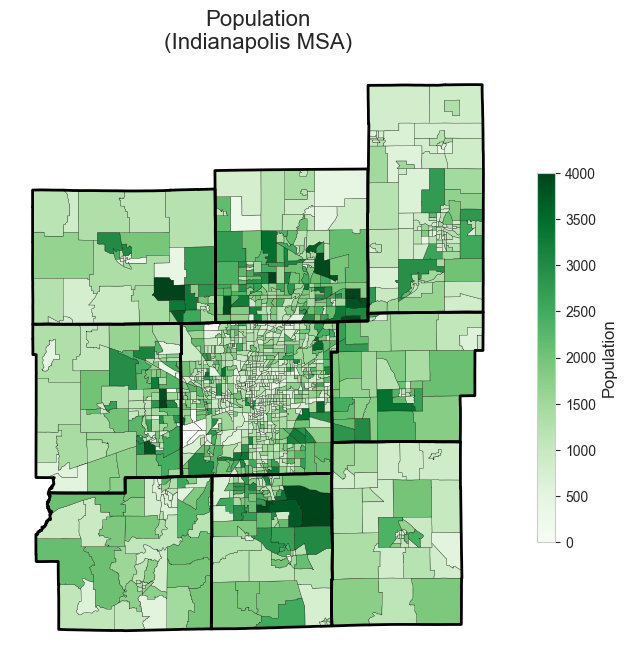

In [33]:
plot_rgn_acs(indy, 'popu', 'Population', 4000, cmap='Greens')

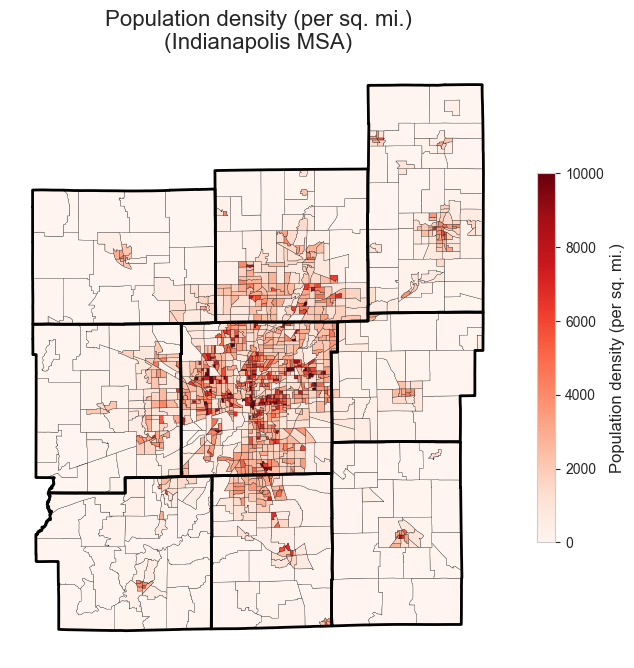

In [34]:
plot_rgn_acs(indy, 'pop_density', 'Population density (per sq. mi.)', 10_000, cmap='Reds')

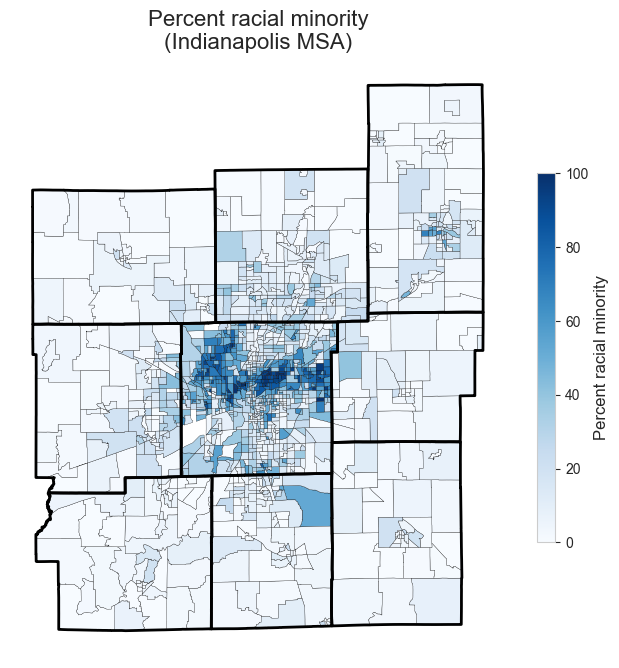

In [35]:
plot_rgn_acs(indy, 'pct_minority', 'Percent racial minority', cmap='Blues',
             df=indy.acs.assign(pct_minority = lambda df: 100 * (1 - df['race_white']/df['popu'])))

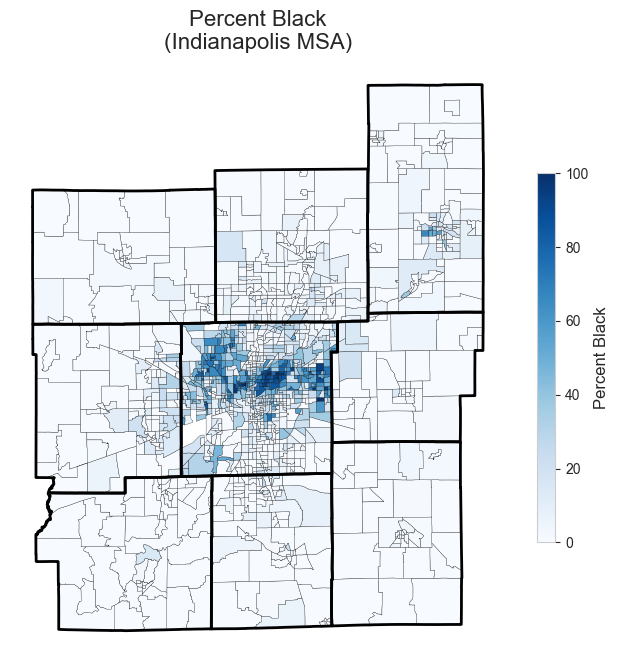

In [36]:
plot_rgn_acs(indy, 'pct_black', 'Percent Black', cmap='Blues',
             df=indy.acs.assign(pct_black = lambda df: 100 * df['race_black']/df['popu']))

### Houston

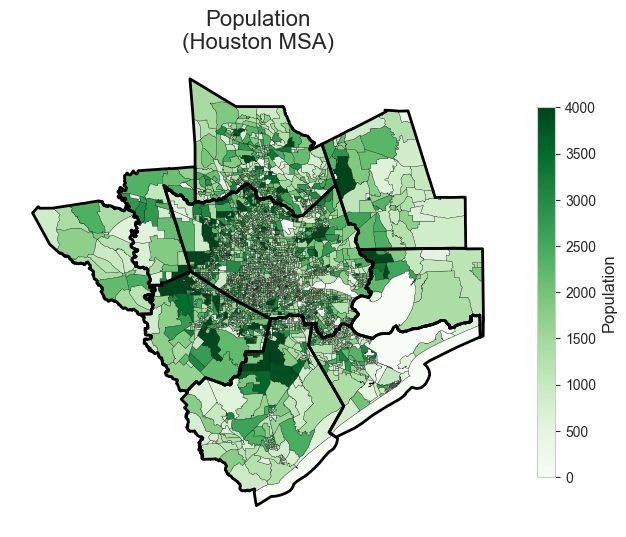

In [37]:
plot_rgn_acs(hous, 'popu', 'Population', 4000, cmap='Greens')

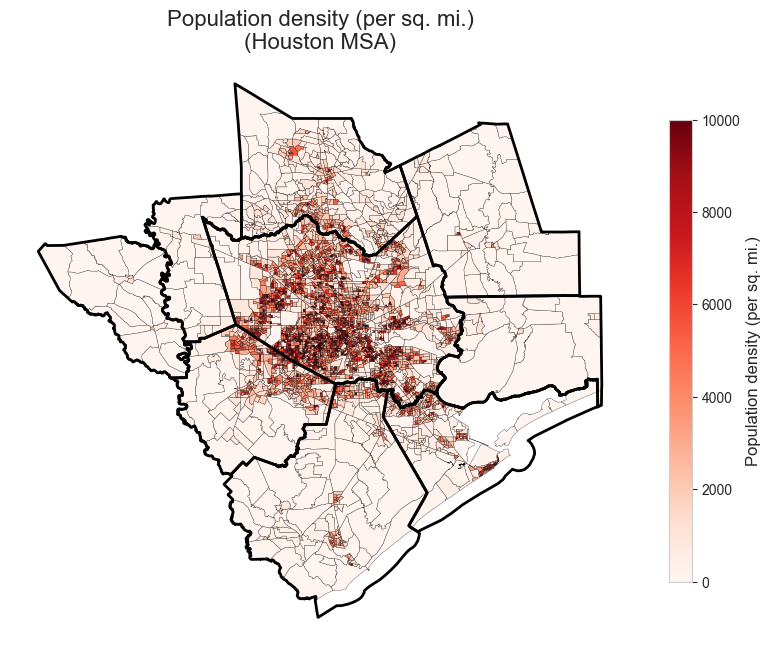

In [38]:
plot_rgn_acs(hous, 'pop_density', 'Population density (per sq. mi.)',
             10_000, cmap='Reds', size=(10, 10))

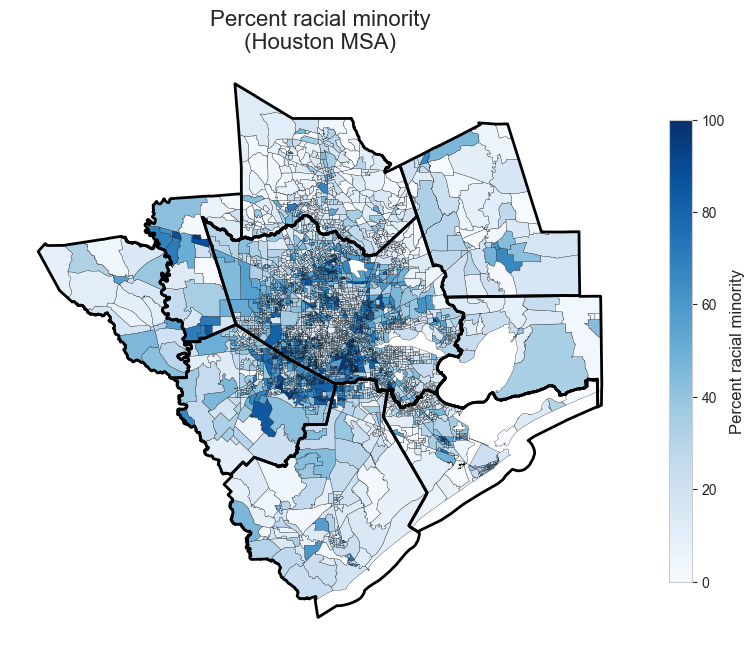

In [39]:
plot_rgn_acs(hous, 'pct_minority', 'Percent racial minority', cmap='Blues', size=(10, 10),
             df=hous.acs.assign(pct_minority = lambda df: 100 * (1 - df['race_white']/df['popu'])))

### Austin

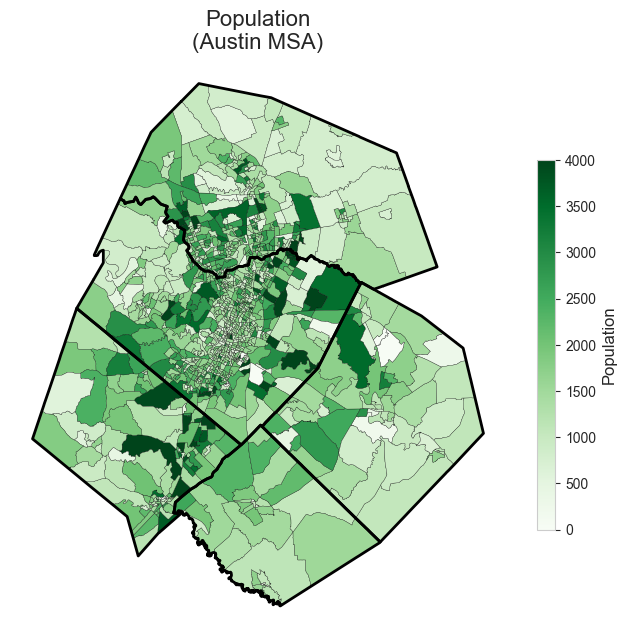

In [40]:
plot_rgn_acs(aus, 'popu', 'Population', 4000, cmap='Greens')

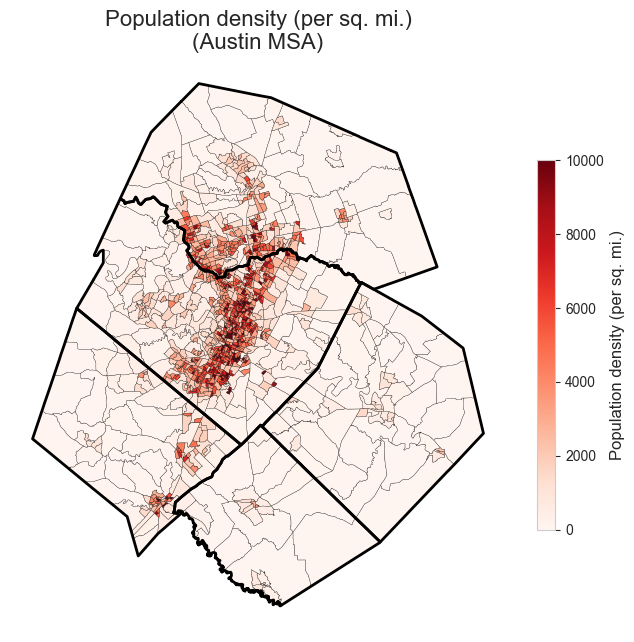

In [41]:
plot_rgn_acs(aus, 'pop_density', 'Population density (per sq. mi.)', 10_000, cmap='Reds')

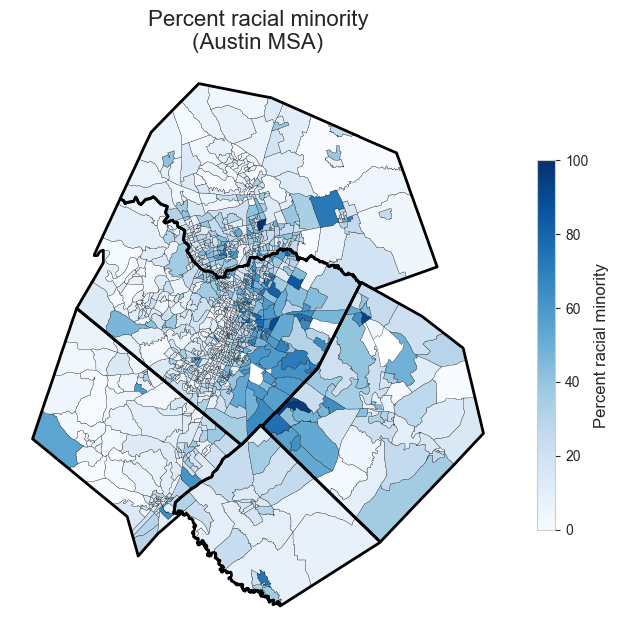

In [42]:
plot_rgn_acs(aus, 'pct_minority', 'Percent racial minority', cmap='Blues',
             df=aus.acs.assign(pct_minority = lambda df: 100 * (1 - df['race_white']/df['popu'])))

## Fig: Study regions

CPU times: user 5.48 s, sys: 305 ms, total: 5.79 s
Wall time: 5.23 s


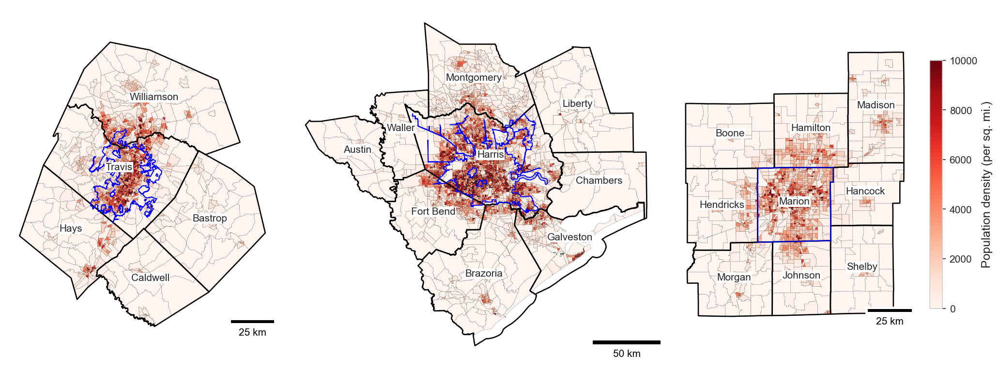

In [69]:
def fig_study_regions(rgns=[aus, hous, indy]):
    fig = plt.figure(figsize=(14, 6), dpi=150)
    gs = mpl.gridspec.GridSpec(1, 3, width_ratios=[0.9, 1.25, 1])
    for i, rgn in enumerate(rgns):
        ax = plt.subplot(gs[i])
        acs = rgn.acs.to_crs(CRS_M)
        acs.plot(ax=ax, column='pop_density', cmap='Reds', vmax=10000,
                 linewidth=0.1, edgecolor='k', legend=i == len(rgns)-1, 
                 legend_kwds=dict(shrink=0.6, label='Population density (per sq. mi.)'))
        cnty = rgn.cnty.to_crs(CRS_M)
        cnty.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=1.25)
        rgn.city_lim.to_crs(CRS_M).plot(ax=ax, facecolor='none', edgecolor='b', 
                                        linestyle='-', linewidth=1)
        cnty_labels = (cnty.assign(geometry = lambda df: df.geometry.centroid)
                       .set_index('name').geometry.apply(lambda x: x.coords[0]))
        for name, xy in cnty_labels.to_dict().items():
            ax.text(*xy, name, ha='center', bbox=dict(fc='w', pad=0.2))
        ax.add_artist(ScaleBar(1, location='lower right'))
        ax = U.plot(ax, axoff=1)
        # ax.set_title(rgn.name.title(), fontsize=20)
    plt.tight_layout()
    P.imsave('Study regions')

%time x = fig_study_regions(); x

# Land use

## Base residential area

In [44]:
def get_base_residential_shp(rgn, save=True, overwrite=False):
    outfile = U.mkdir(rgn.geom / 'residential/') / '0.gpkg'
    if os.path.exists(outfile) and not overwrite:
        return gpd.read_file(outfile)
    # land use layer of the city as prepared in the `General` project
    lu = gpd.read_file(MK / f'general/data/cities/{rgn}/land_use.gpkg')
    # residential regions as defined as category "O" (origin)
    geom = [(lu[lu['dmd_kind'].isin(['O', 'OD'])].geometry.unary_union)]
    resi = Gdf({'geometry': geom}, crs=CRS_DEG)
    # filter within city boundary
    resi = gpd.clip(resi, rgn.city_lim.to_crs(resi.crs))
    if save:
        resi.to_file(outfile)
    return resi

In [45]:
%time indy.r0 = get_base_residential_shp(indy).disp() # t=55s (saving), t=4s (loading)

1 rows x 1 cols; Memory: 0.0 MiB; CRS: epsg:4326


,geometry
,<geometry>
0,"MULTIPOLYGON (((-86.325683 39.632647, -86.3257..."


CPU times: user 2.44 s, sys: 415 ms, total: 2.85 s
Wall time: 3.9 s


In [46]:
%time aus.r0 = get_base_residential_shp(aus) # t=43s (saving), 2s (loading)

CPU times: user 815 ms, sys: 153 ms, total: 968 ms
Wall time: 1.61 s


In [47]:
%time hous.r0 = get_base_residential_shp(hous) # t=2:59 (saving), t=2s (loading)

CPU times: user 1.63 s, sys: 182 ms, total: 1.81 s
Wall time: 2.49 s


## Buffers around residential area

In [48]:
from pqdm.processes import pqdm

In [49]:
buffers = (5, 10, 15, 20, 25, 50, 75, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700, 750, 800, 850, 900, 950, 1000)

In [50]:
def save_resi_buffers(rgn, buffers=buffers):
    for buf in tqdm(buffers):
        df = rgn.r0.to_crs(CRS_M).buffer(buf).to_crs(CRS_DEG)
        print(f'Done preparing buffer {buf} m')
        df.to_file(rgn.geom + f'residential/{buf}.gpkg')
        print(f'Done saving buffer {buf} m')

## Visualize the buffers

In [51]:
def get_resi_buffers(rgn, cmap='rainbow_r'):
    R = pd.concat([
        gpd.read_file(f).assign(buffer = int(f.split('/')[-1].split('.')[0]))
        for f in tqdm(glob(str(rgn.geom) + '/residential/*.gpkg'))
    ]).set_index('buffer').sort_index()
    R = gpd.clip(R, rgn.city_lim.to_crs(R.crs))
    R['color'] = list(sns.color_palette(cmap, len(R)).as_hex())
    R.loc[0, 'color'] = '#000000'
    return R

In [52]:
%time indy.R = get_resi_buffers(indy) # t=23s
indy.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/27 [00:00<?, ?it/s]

CPU times: user 14.3 s, sys: 1.29 s, total: 15.5 s
Wall time: 17.4 s
27 rows x 1 cols; Memory: 0.0 MiB


,color
buffer,<object>
1000,#ff1c0e
950,#ff381c


In [53]:
%time aus.R = get_resi_buffers(aus) # t=20s
# aus.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/27 [00:00<?, ?it/s]

CPU times: user 13.1 s, sys: 1.03 s, total: 14.1 s
Wall time: 15.5 s


In [54]:
%time hous.R = get_resi_buffers(hous) # t=53s
# hous.R.drop(columns='geometry').disp(2); pass

  0%|          | 0/27 [00:00<?, ?it/s]

CPU times: user 42.1 s, sys: 3.42 s, total: 45.5 s
Wall time: 46.9 s


In [55]:
def plot_resi_buffers(rgn, resi=None, size=(30, 30), dpi=70):
    R = resi or getattr(rgn, 'R')
    ax = U.plot(size=size, dpi=dpi)
    R.to_crs(CRS_M).sort_index(ascending=False).plot(ax=ax, color=R['color'], edgecolor='none')
    ax.legend(handles=[
        mpl.patches.Patch(color=color, label=str(buf)) for buf, color in 
        R['color'].sort_index().to_dict().items()],
              title='Buffer width (m)', loc='upper right', fontsize=20)
    rgn.city_lim.to_crs(CRS_M).plot(ax=ax, facecolor='none', edgecolor='r', linewidth=5)
    P.imsave('Land use buffers in ' + rgn.name)

CPU times: user 15.3 s, sys: 434 ms, total: 15.8 s
Wall time: 15.3 s


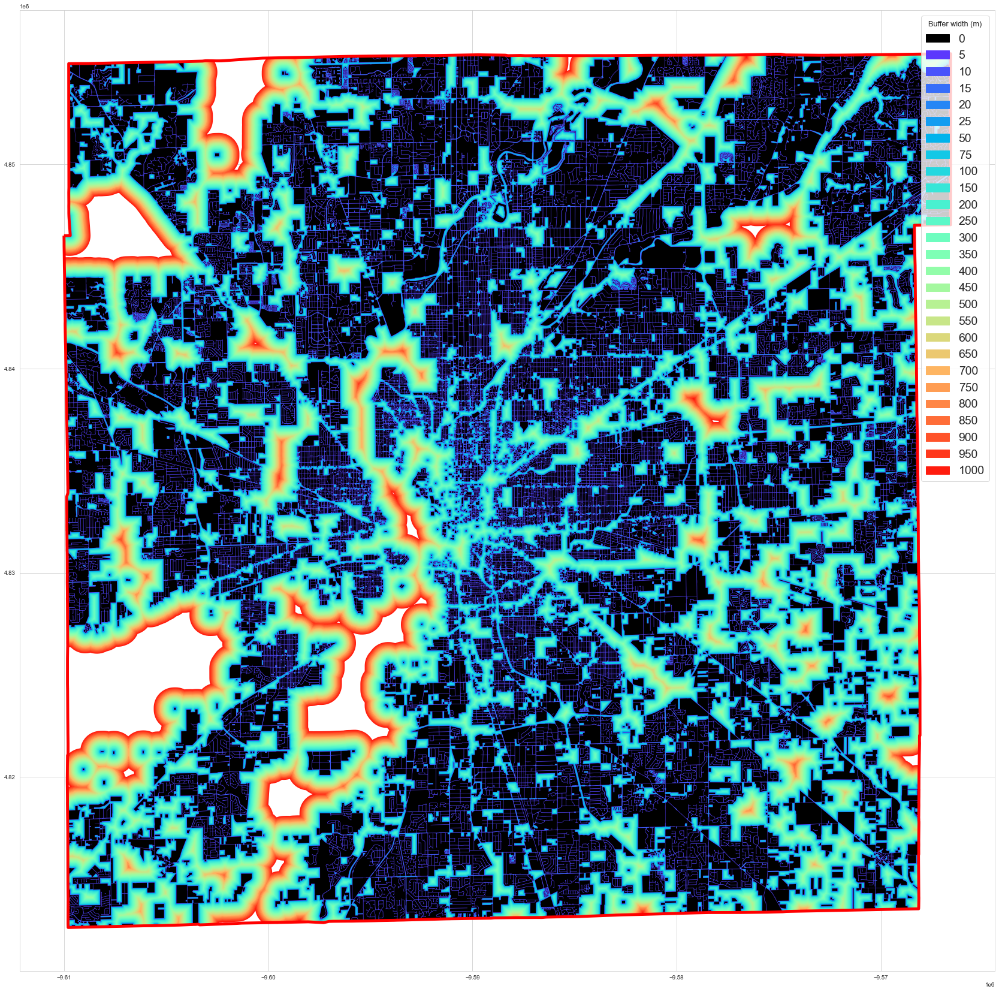

In [56]:
plot_resi_buffers(indy) # t=25s

CPU times: user 10.3 s, sys: 352 ms, total: 10.6 s
Wall time: 10.2 s


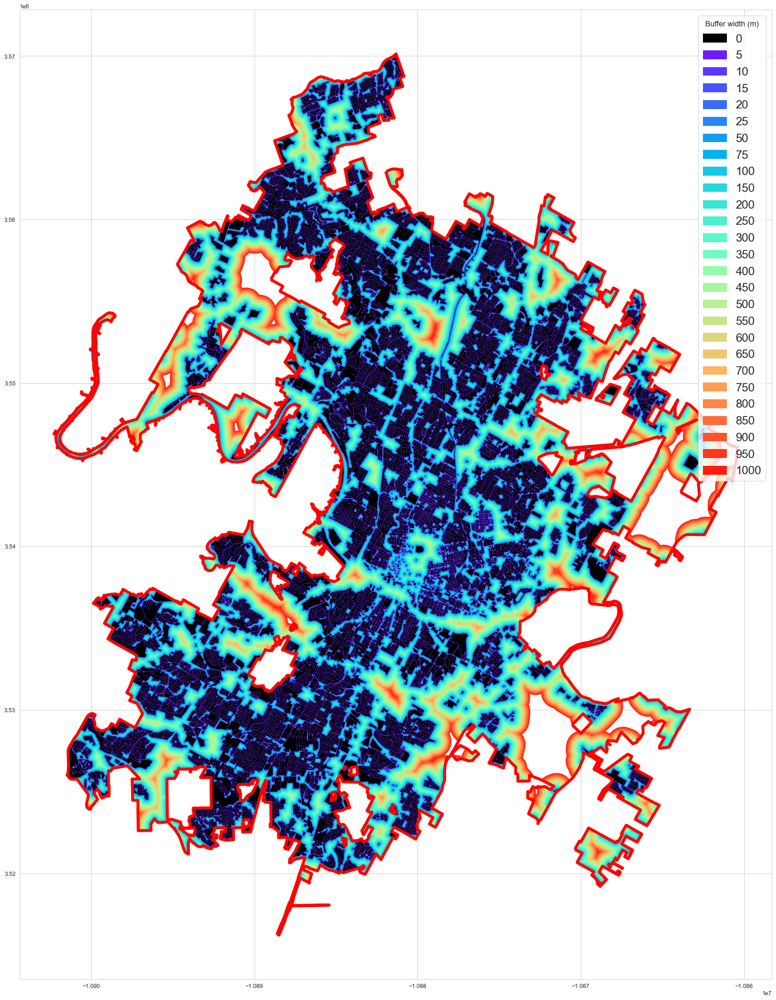

In [57]:
plot_resi_buffers(aus) # t=18s

CPU times: user 21.7 s, sys: 1 s, total: 22.7 s
Wall time: 22.3 s


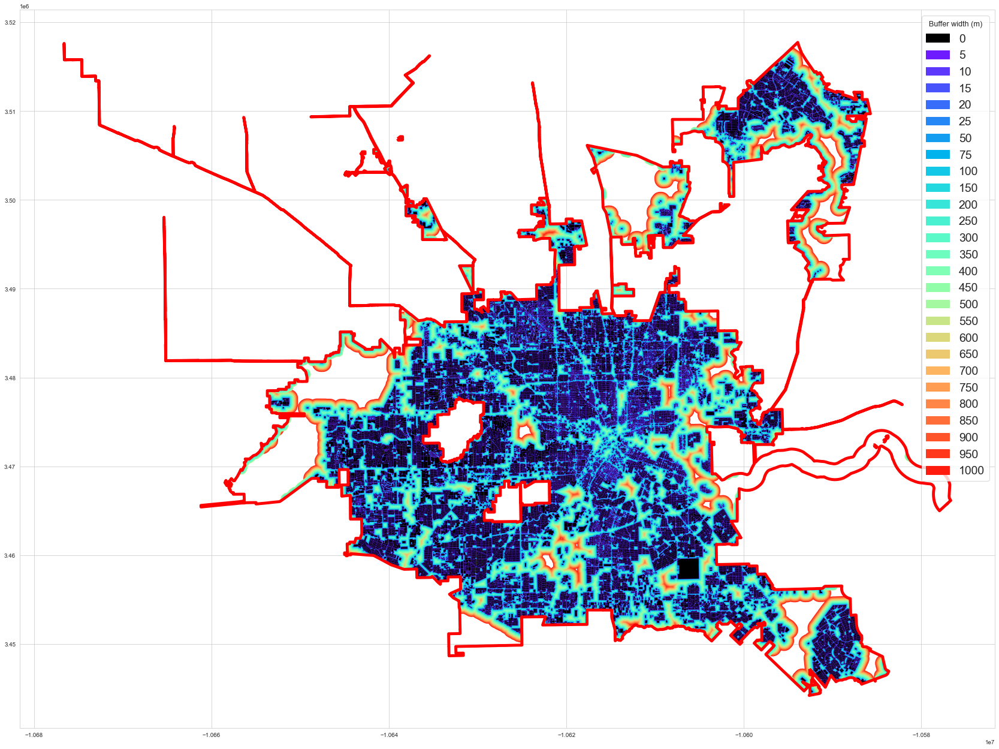

In [58]:
plot_resi_buffers(hous) # t=18s

## [Using OSM] Download OSM state database

In [59]:
def download_osm_db(rgn):
    outpath = UMNI / f'data/geometry/usa/{rgn.state}/osm'
    if os.path.exists(outpath): return
    mk.geo.download_osm_db_shp(rgn.state, outdir=outpath)